In [1]:
import os
import pandas as pd
import scanpy as sc

import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "utils")))
from analysis_utils import volcano_plot_br, plot_spatial_clusters_per_sample, plot_dotplot_by_treatment

In [2]:
ad = sc.read_h5ad('../data/ST_BRICHOS.h5ad')


In [3]:
ad.obs['barcode'] = list(pd.DataFrame(ad.obs.index)[0].str.split('-P', expand = True)[0])

In [4]:
import os
import pandas as pd

# Folder where the anatomical annotation CSVs are located
annotation_dir = "../data/anatomical_annotations"  # ← Update this path

# Accepted column names for anatomical region
region_column_candidates = ["Anatomical clustering", "Anatomical sectioning","Anatomical Clustering"]

# Build the master mapping dictionary
barcode_to_region = {}

for fname in os.listdir(annotation_dir):
    if not fname.endswith(".csv"):
        continue

    fpath = os.path.join(annotation_dir, fname)
    df = pd.read_csv(fpath)

    # Try to find the correct column
    region_col = next((col for col in region_column_candidates if col in df.columns), None)
    if region_col is None or "Barcode" not in df.columns:
        print(f"⚠️ Skipping {fname}: Missing 'Barcode' or region column")
        continue

    df['Barcode'] = df['Barcode'].astype(str).str.strip()
    df[region_col] = df[region_col].astype(str).str.strip()

    # Add to global mapping
    for barcode, region in zip(df['Barcode'], df[region_col]):
        barcode_to_region[barcode] = region

print(f"✅ Built mapping for {len(barcode_to_region)} barcodes")


✅ Built mapping for 4171 barcodes


In [5]:
# Extract raw barcode (if index includes suffix like '-1-P28052_101')

# Apply mapping
ad.obs['anatomical_region'] = ad.obs['barcode'].map(barcode_to_region)

print("✅ Mapped anatomical regions to AnnData")

✅ Mapped anatomical regions to AnnData


In [6]:
ad.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,sample,sample_id,n_genes,leiden,treatment,barcode,anatomical_region
AAACAAGTATCTCCCA-1-P24215_301,1,50,102,28217,34029,P24215_301,P24215_301,5333,7,BRICHOS,AAACAAGTATCTCCCA-1,Cortex Layer 1
AAACAGAGCGACTCCT-1-P24215_301,1,14,94,10018,31732,P24215_301,P24215_301,3317,2,BRICHOS,AAACAGAGCGACTCCT-1,Cortex Layers 5/6
AAACCGGGTAGGTACC-1-P24215_301,1,42,28,24142,12539,P24215_301,P24215_301,4982,5,BRICHOS,AAACCGGGTAGGTACC-1,Striatum
AAACCGTTCGTCCAGG-1-P24215_301,1,52,42,29202,16598,P24215_301,P24215_301,6046,0,BRICHOS,AAACCGTTCGTCCAGG-1,Ophtalmic region
AAACCTCATGAAGTTG-1-P24215_301,1,37,19,21611,9928,P24215_301,P24215_301,6179,5,BRICHOS,AAACCTCATGAAGTTG-1,Striatum
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1-P28052_203,1,24,64,15524,23040,P28052_203,P28052_203,7233,4,PBS,TTGTTCAGTGTGCTAC-1,Putamen
TTGTTGTGTGTCAAGA-1-P28052_203,1,31,77,19072,26813,P28052_203,P28052_203,7315,4,PBS,TTGTTGTGTGTCAAGA-1,Putamen
TTGTTTCATTAGTCTA-1-P28052_203,1,60,30,33717,13124,P28052_203,P28052_203,6504,2,PBS,TTGTTTCATTAGTCTA-1,Ophtalmic region
TTGTTTCCATACAACT-1-P28052_203,1,45,27,26128,12265,P28052_203,P28052_203,5322,2,PBS,TTGTTTCCATACAACT-1,Ophtalmic region


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


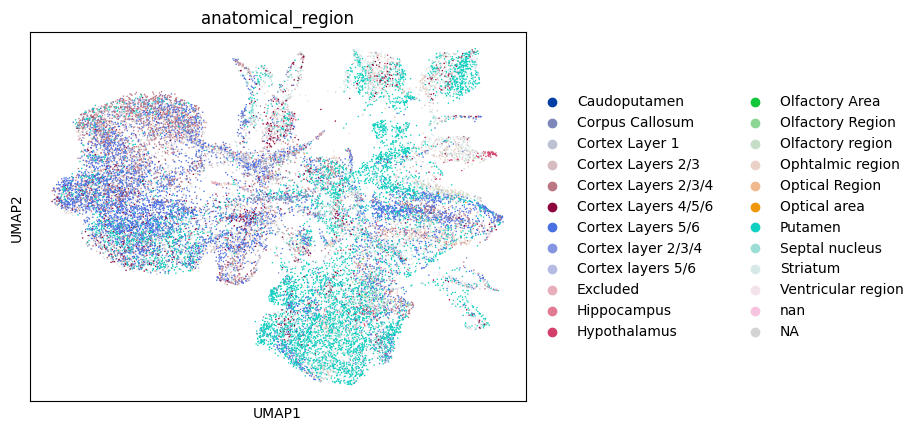

In [7]:
sc.pl.umap(ad, color = 'anatomical_region')

📍 Plotting sample: P24215_301


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


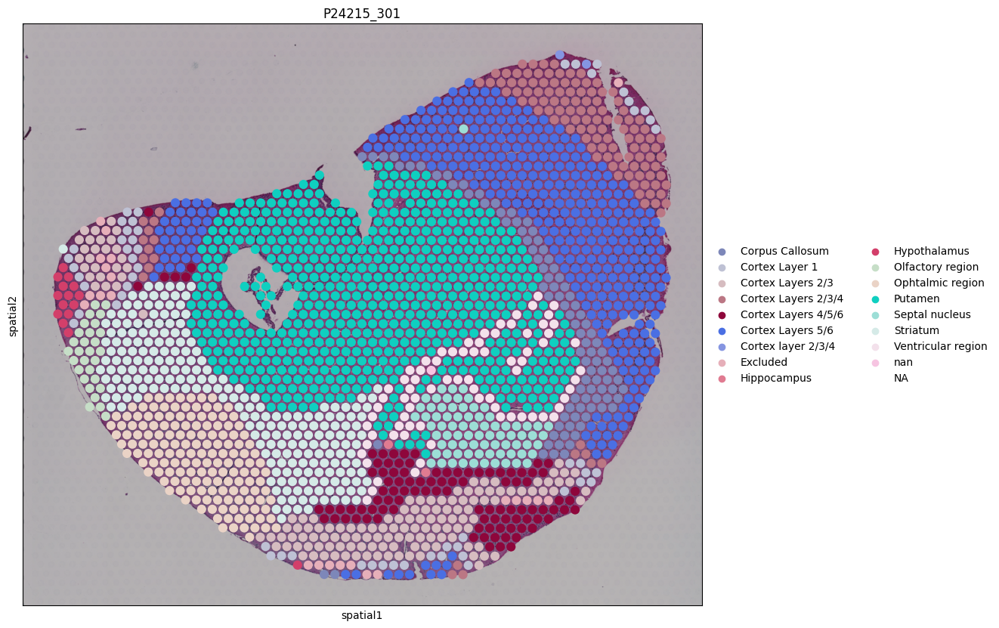

📍 Plotting sample: P28052_201


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


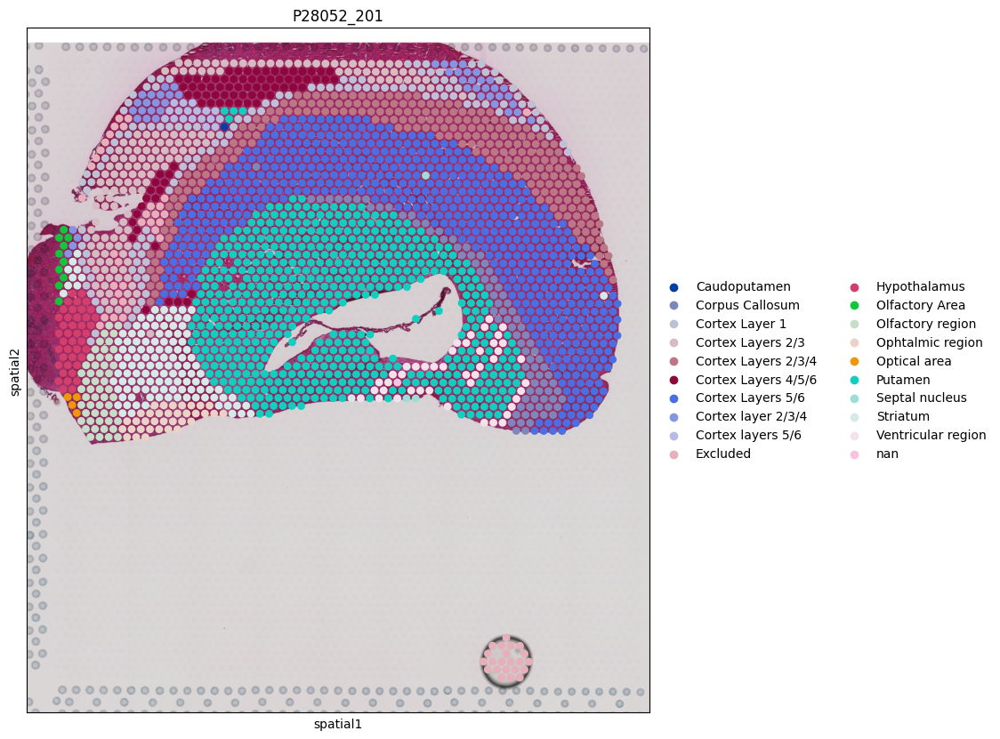

📍 Plotting sample: P24215_101


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


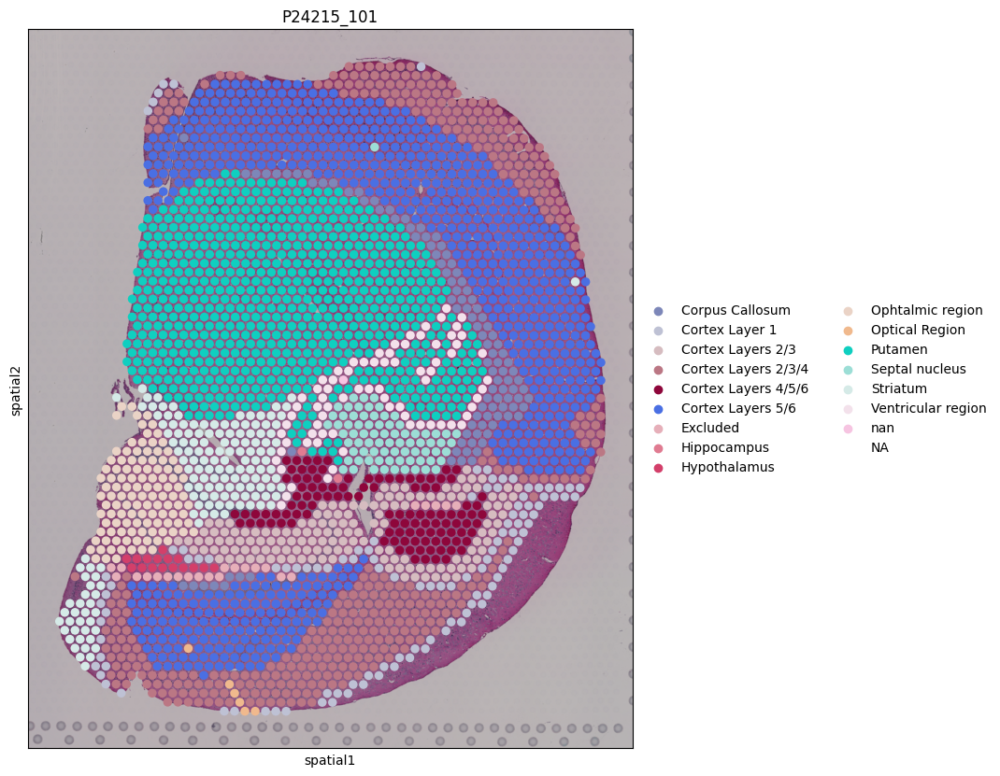

📍 Plotting sample: P28052_103


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


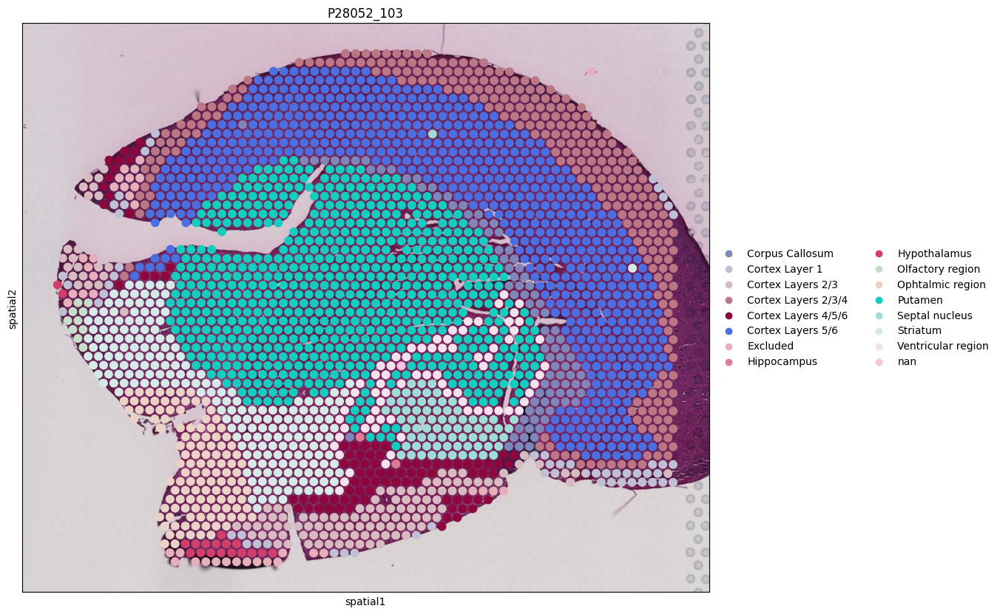

📍 Plotting sample: P28052_102


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


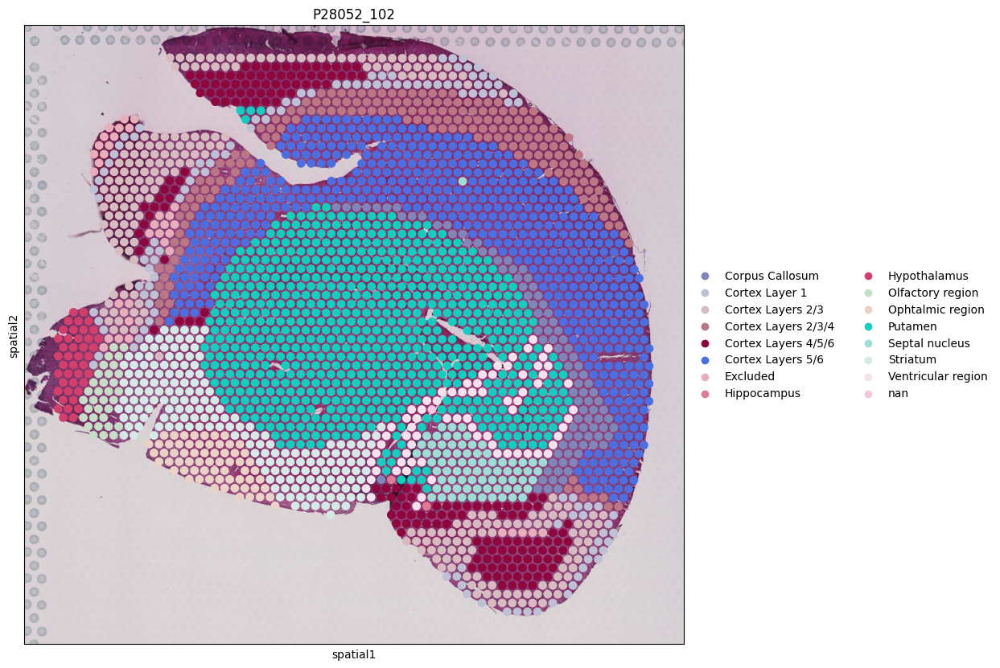

📍 Plotting sample: P28052_401


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


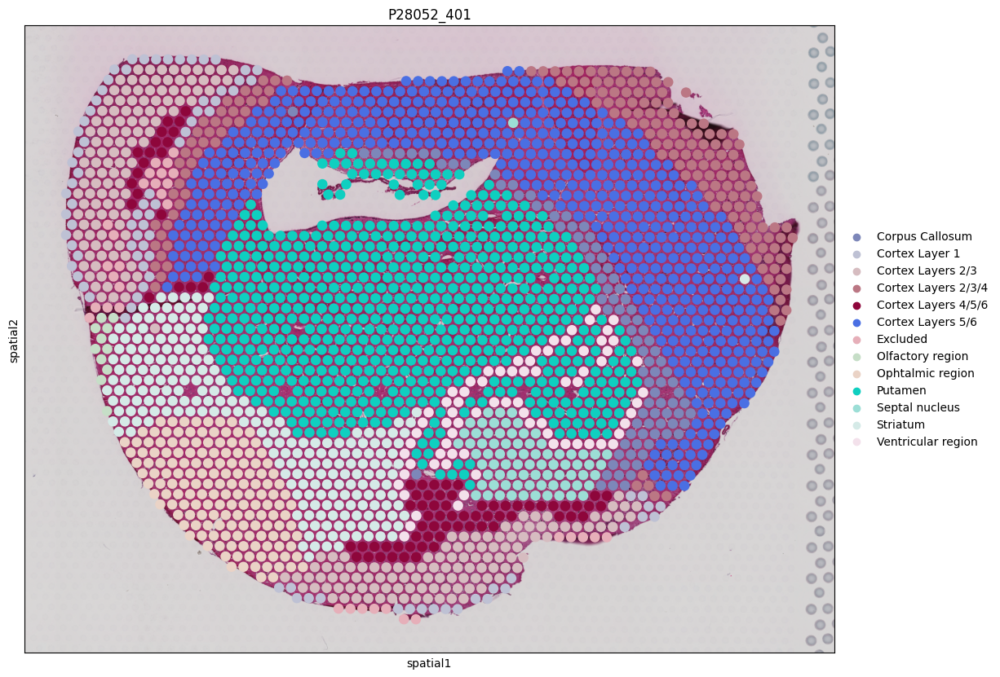

📍 Plotting sample: P24215_201


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


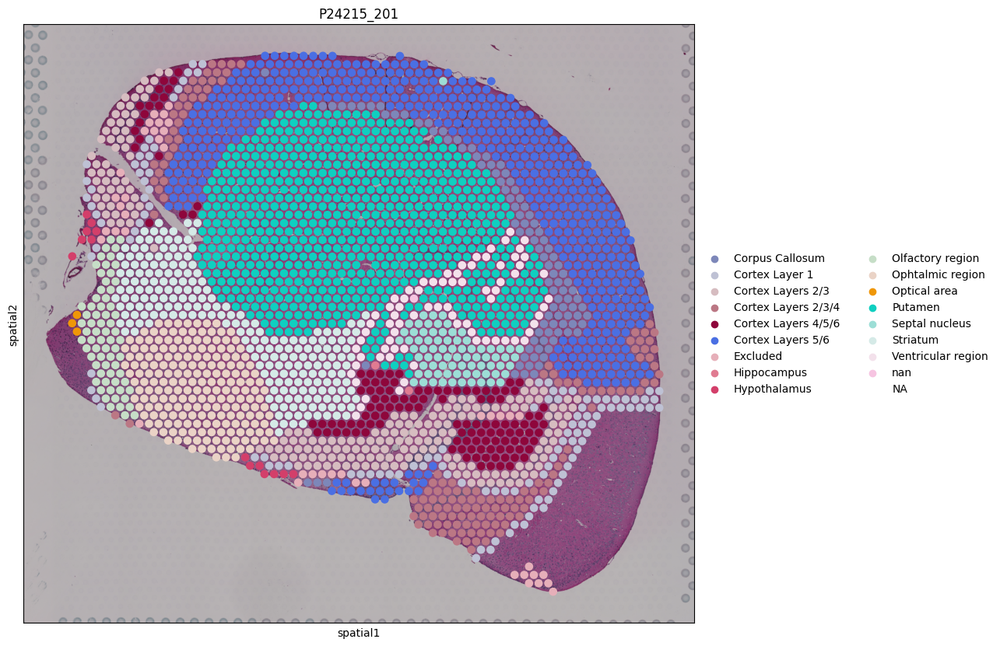

📍 Plotting sample: P28052_301


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


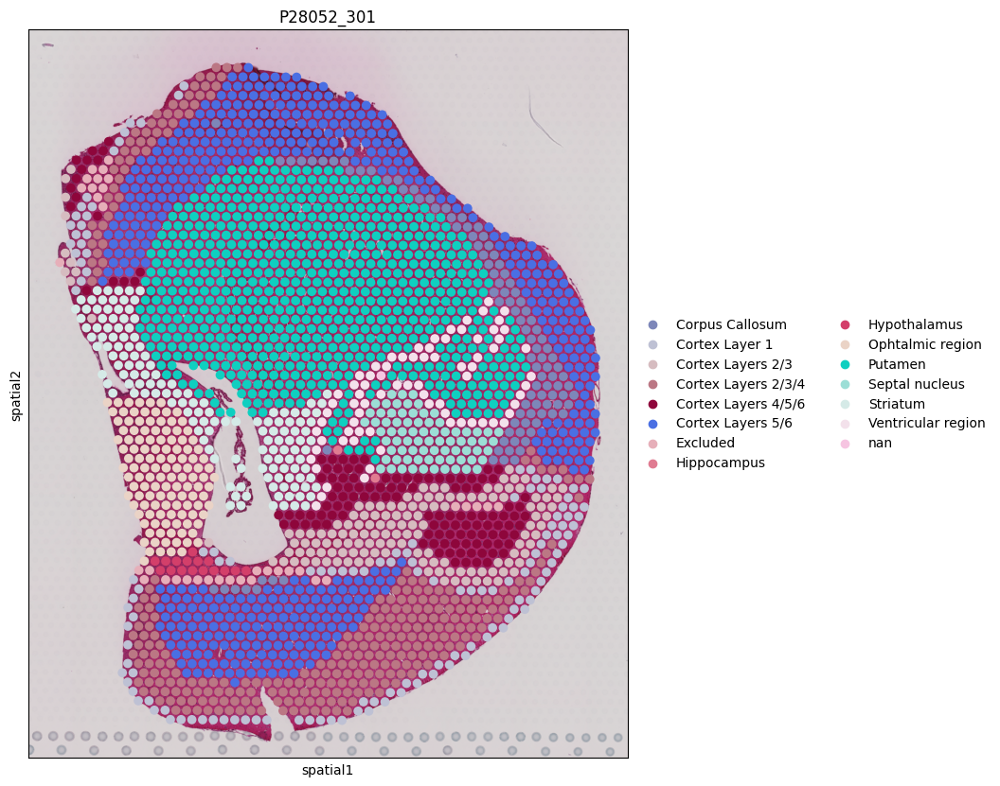

📍 Plotting sample: P28052_202


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


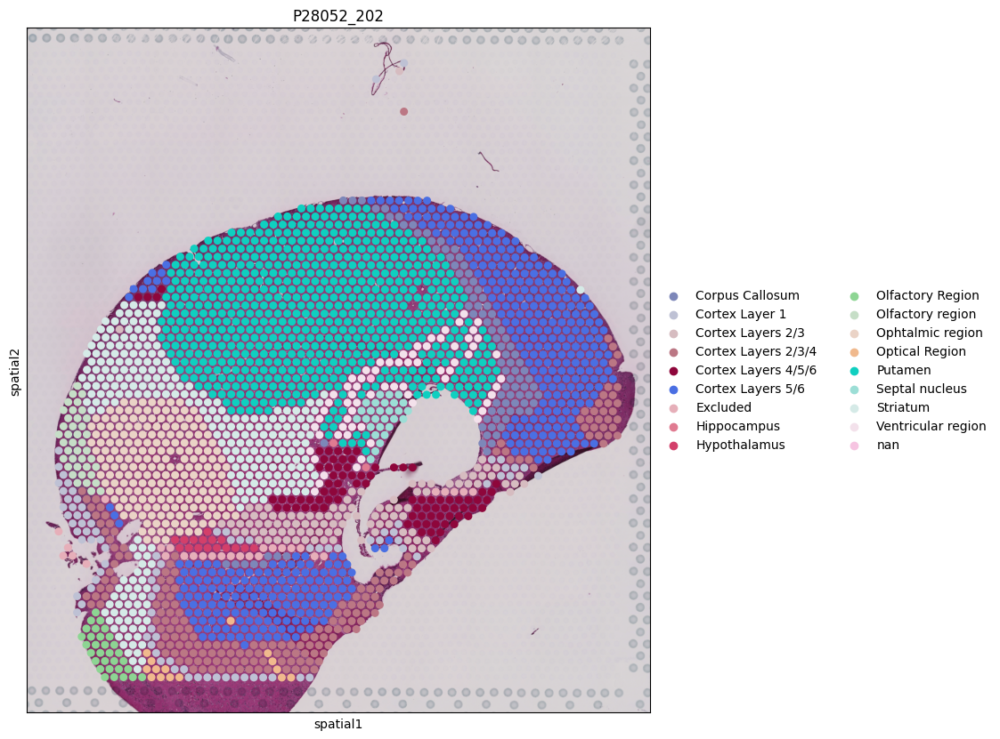

📍 Plotting sample: P28052_203


/Users/chrislangseth/miniforge3/envs/TF_SONOMA/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


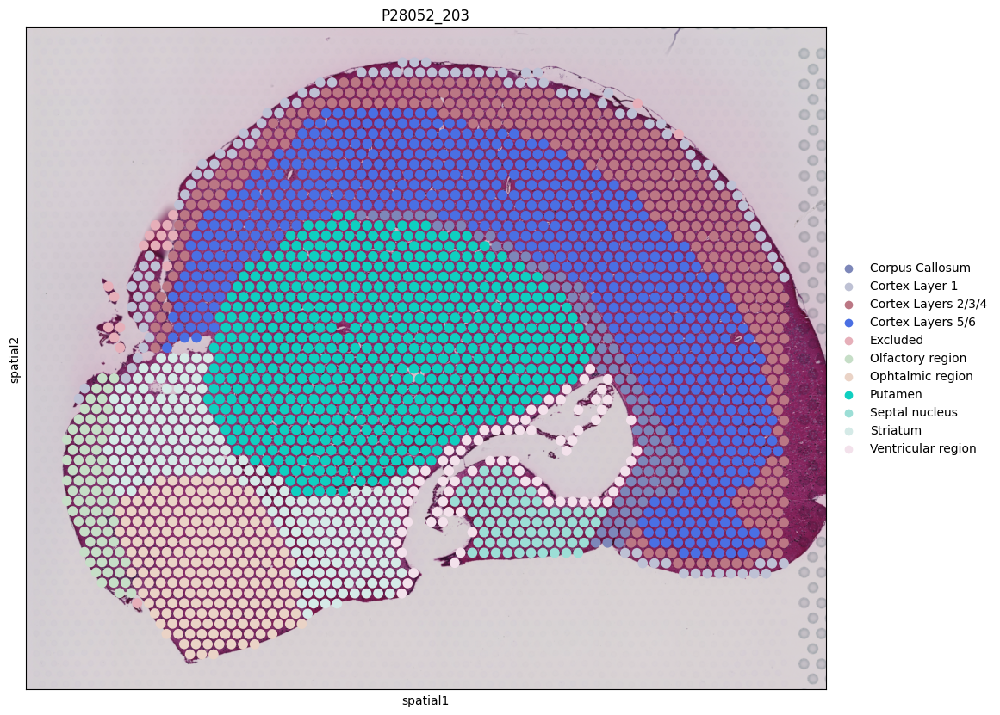

In [8]:
plot_spatial_clusters_per_sample(ad, color='anatomical_region')